In [1]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
from scipy import ndimage
from skimage.feature import canny

In [2]:
#візуалізація трьох зображень у ряд, підписи опціональні
def show_images(img1, img2, img3, title1=None, title2=None, title3=None, cmap=None):
    fig, ax = plt.subplots(1, 3, figsize=(22, 7))
    ax[0].imshow(img1)
    ax[1].imshow(img2, cmap=cmap)
    ax[2].imshow(img3)
    if title1 and title2 and title3 != None:
        ax[0].set_title(f'{title1}')
        ax[1].set_title(f'{title2}')
        ax[2].set_title(f'{title3}')
    plt.tight_layout()
    plt.show()

Розмірності зображень: (500, 500, 3), (450, 800, 3), (600, 400, 3)


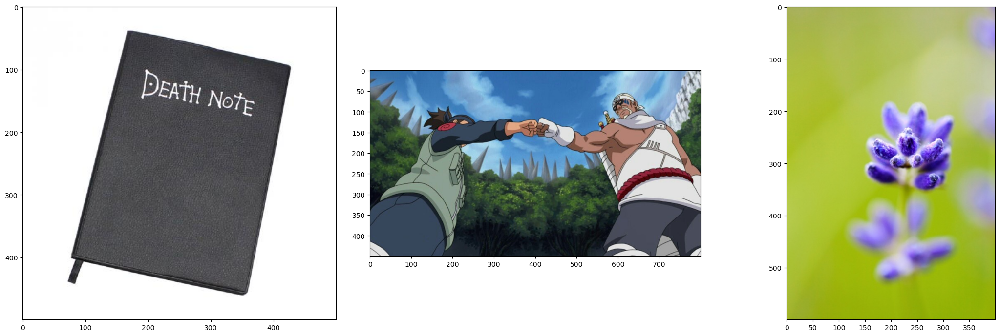

In [3]:
deathnote=cv.imread('death_note.jpg')
killer=cv.imread('killer.jpg')
flower=cv.imread('flower1.jpg')

print(f'Розмірності зображень: {deathnote.shape}, {killer.shape}, {flower.shape}')

#формат RGB
deathnote_rgb = cv.cvtColor(deathnote, cv.COLOR_BGR2RGB)
killer_rgb = cv.cvtColor(killer, cv.COLOR_BGR2RGB)
flower_rgb = cv.cvtColor(flower, cv.COLOR_BGR2RGB)

#формат GRAY
deathnote_gray = cv.cvtColor(deathnote, cv.COLOR_BGR2GRAY)
killer_gray = cv.cvtColor(killer, cv.COLOR_BGR2GRAY)
flower_gray = cv.cvtColor(flower, cv.COLOR_BGR2GRAY)

show_images(deathnote_rgb, killer_rgb, flower_rgb)

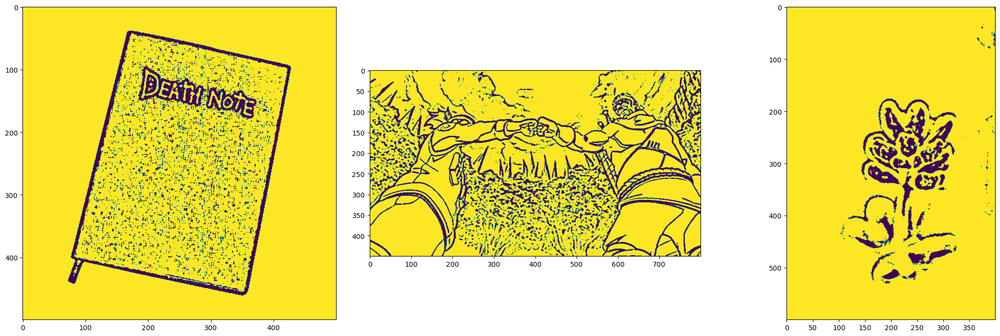

In [4]:
#Обробка зображень за допомогою адаптивного порогу
img1 = cv.medianBlur(deathnote_gray,5)
th1 = cv.adaptiveThreshold(img1,255,cv.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv.THRESH_BINARY,11,2)

img2 = cv.medianBlur(killer_gray,5)
th2 = cv.adaptiveThreshold(img2,255,cv.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv.THRESH_BINARY,11,2)

img3 = cv.medianBlur(flower_gray,5)
th3 = cv.adaptiveThreshold(img3,255,cv.ADAPTIVE_THRESH_MEAN_C,\
            cv.THRESH_BINARY,11,2)

show_images(th1, th2, th3)

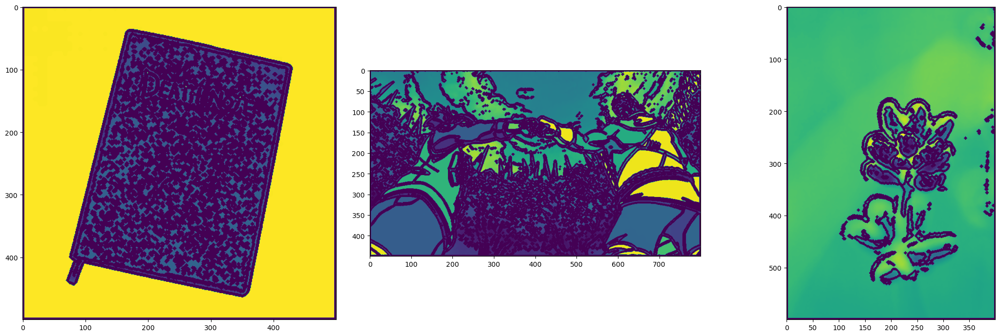

In [5]:
#Пошук контурів
contours, hierarchy = cv.findContours(th1, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
cv.drawContours(img1, contours, -1, (0,255,0), 3)

contours, hierarchy = cv.findContours(th2, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
cv.drawContours(img2, contours, -1, (0,255,0), 3)

contours, hierarchy = cv.findContours(th3, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
cv.drawContours(img3, contours, -1, (0,255,0), 3)

show_images(img1, img2, img3)

Оцінки:

* Зображення №1 - 8
* Зображення №2 - 6
* Зображення №3 - 7

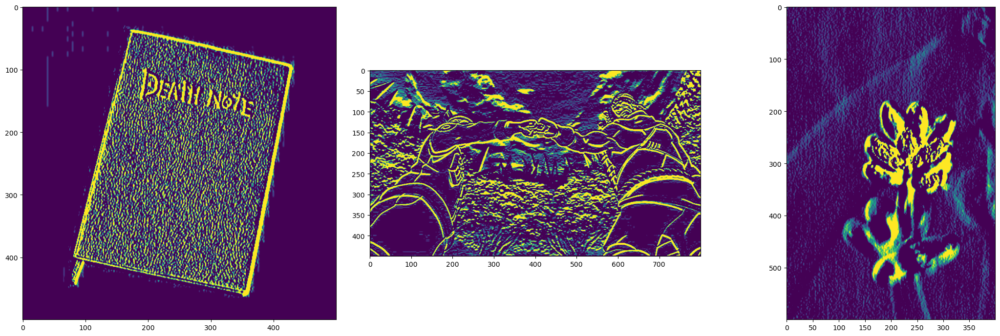

In [6]:
#Метод Собеля
sobelx1 = cv.Sobel(deathnote_gray,cv.CV_8U,1,0,ksize=5)
sobely2 = cv.Sobel(killer_gray,cv.CV_8U,0,1,ksize=5)
sobelx3 = cv.Sobel(flower_gray,cv.CV_8U,1,0,ksize=5)

show_images(sobelx1, sobely2, sobelx3)

Оцінки:

* Зображення №1 - 10
* Зображення №2 - 8
* Зображення №3 - 8

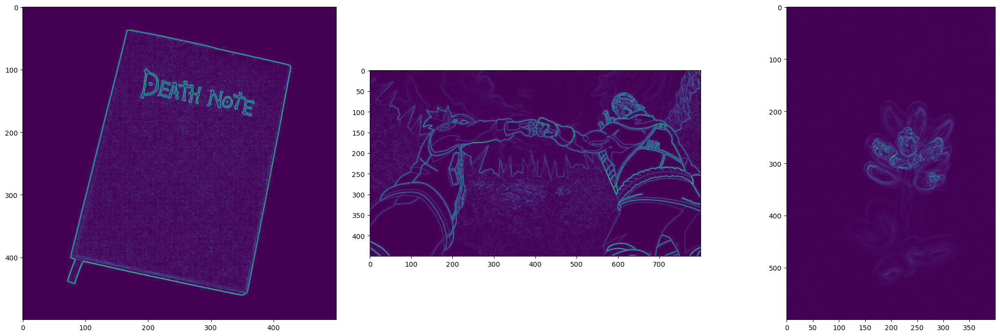

In [7]:
#Метод Робертса
def roberts_edge_detection(img):
    roberts_cross_v = np.array( [[1, 0],
                             [0,-1]] )
  
    roberts_cross_h = np.array( [[0, 1],
                             [-1, 0]] )

    image = img.astype('float64')
    image/=255.0
    vertical = ndimage.convolve(image, roberts_cross_v)
    horizontal = ndimage.convolve(image, roberts_cross_h)

    edged_img = np.sqrt(np.square(horizontal) + np.square(vertical))
    edged_img*=255
    return edged_img

roberts1 = roberts_edge_detection(deathnote_gray)
roberts2 = roberts_edge_detection(killer_gray)
roberts3 = roberts_edge_detection(flower_gray)

show_images(roberts1, roberts2, roberts3)

Оцінки:

* Зображення №1 - 10
* Зображення №2 - 8
* Зображення №3 - 6

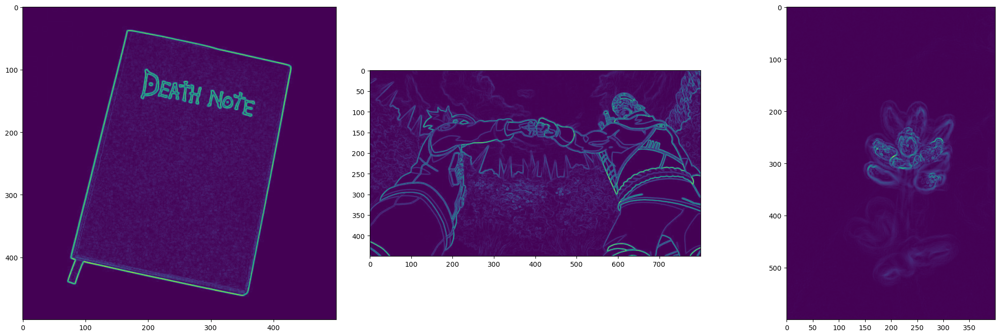

In [8]:
#Метод Превітта
def prewitt_edge_detection(img):
    prewitt_v = np.array( [[-1, -1, -1], [0, 0, 0],
                             [1, 1, 1]] )
  
    prewitt_h = np.array( [[-1, 0, 1], [-1, 0, 1],
                             [-1, 0, 1]] )

    image = img.astype('float64')
    image/=255.0
    vertical = ndimage.convolve(image, prewitt_v)
    horizontal = ndimage.convolve(image, prewitt_h)

    edged_img = np.sqrt(np.square(horizontal) + np.square(vertical))
    edged_img*=255
    return edged_img

prewitt1 = prewitt_edge_detection(deathnote_gray)
prewitt2 = prewitt_edge_detection(killer_gray)
prewitt3 = prewitt_edge_detection(flower_gray)

show_images(prewitt1, prewitt2, prewitt3) 

Оцінки:

* Зображення №1 - 10
* Зображення №2 - 8
* Зображення №3 - 7

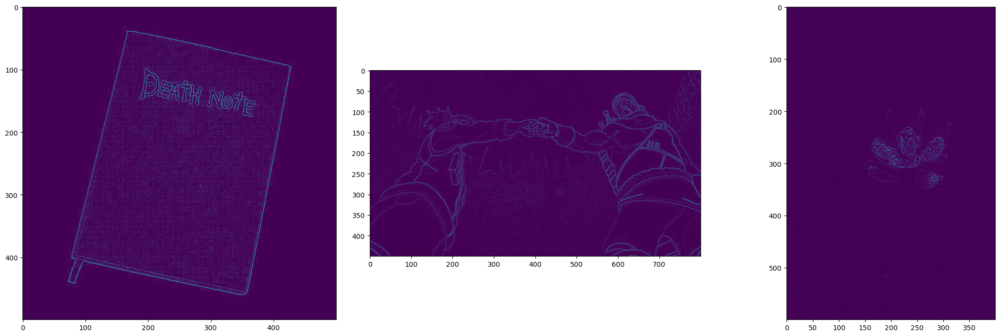

In [9]:
#Оператор Лапласіана
laplacian1 = cv.Laplacian(deathnote_gray,cv.CV_8U)
laplacian2 = cv.Laplacian(killer_gray,cv.CV_8U)
laplacian3 = cv.Laplacian(flower_gray,cv.CV_8U)

show_images(laplacian1, laplacian2, laplacian3)

Оцінки:

* Зображення №1 - 6
* Зображення №2 - 6
* Зображення №3 - 2

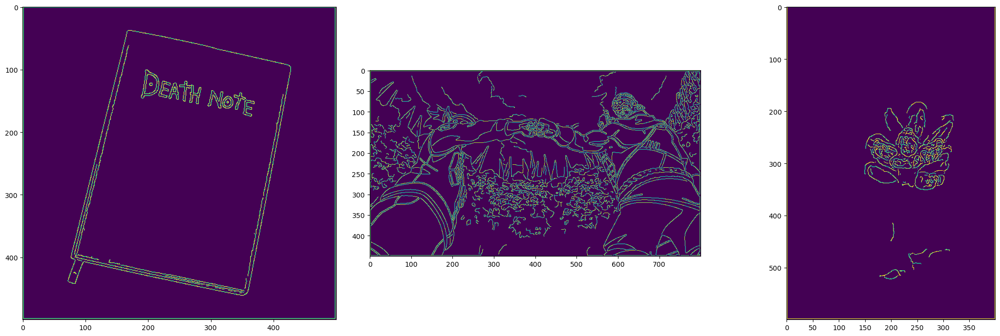

In [10]:
#Метод Кенні
canny1 = canny(deathnote_gray, sigma=1)
canny2 = canny(killer_gray, sigma=1)
canny3 = canny(flower_gray, sigma=1)

show_images(canny1, canny2, canny3)

Оцінки:

* Зображення №1 - 6
* Зображення №2 - 6
* Зображення №3 - 5

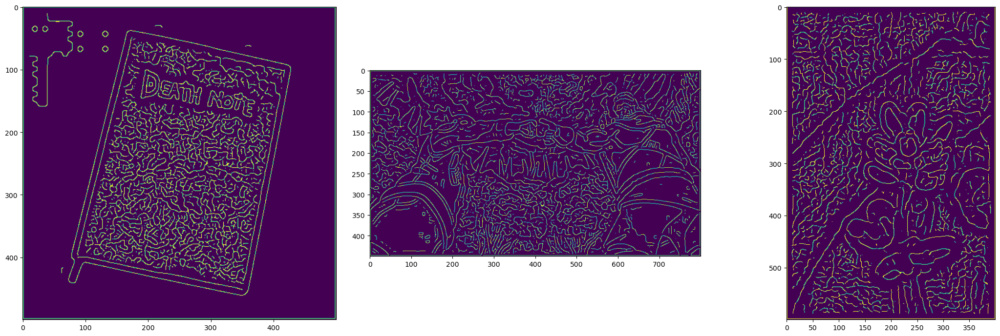

In [11]:
canny1 = canny(deathnote_gray, sigma=3, low_threshold=0.05, high_threshold=0.09)
canny2 = canny(killer_gray, sigma=3, low_threshold=0.05, high_threshold=0.09)
canny3 = canny(flower_gray, sigma=3, low_threshold=0.05, high_threshold=0.09)

show_images(canny1, canny2, canny3)

Оцінки:

* Зображення №1 - 7
* Зображення №2 - 5
* Зображення №3 - 6

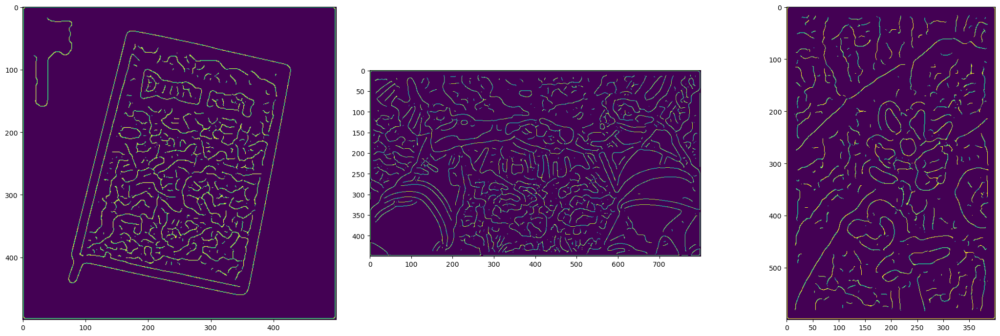

In [12]:
canny1 = canny(deathnote_gray, sigma=5, low_threshold=0.1, high_threshold=0.3)
canny2 = canny(killer_gray, sigma=5, low_threshold=0.1, high_threshold=0.3)
canny3 = canny(flower_gray, sigma=5, low_threshold=0.1, high_threshold=0.3)

show_images(canny1, canny2, canny3)

Оцінки:

* Зображення №1 - 5
* Зображення №2 - 3
* Зображення №3 - 3

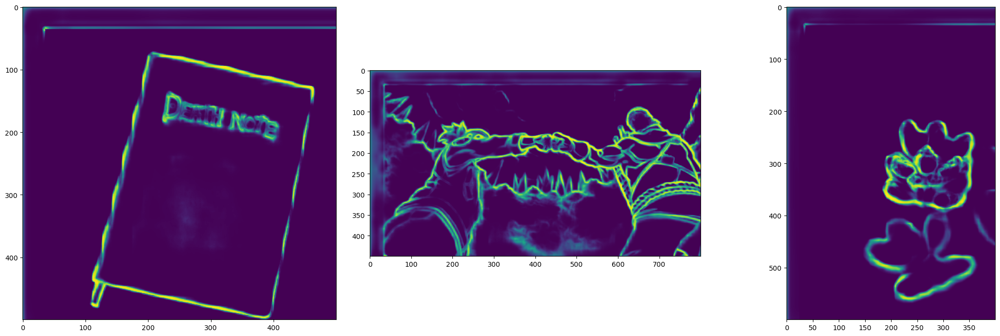

In [13]:
#Метод HED

def holistically_nested_edge_detection(img):
    (H,W) = img.shape[:2]
    blob = cv.dnn.blobFromImage(img, scalefactor=1.0, size=(W,H),
                                swapRB=False, crop=False)
    net = cv.dnn.readNetFromCaffe('deploy.prototxt', 'hed_pretrained_bsds.caffemodel')
    net.setInput(blob)
    hed = net.forward()
    hed = cv.resize(hed[0, 0], (W,H))
    hed = (255 * hed).astype('uint8')
    return hed

hed1 = holistically_nested_edge_detection(deathnote_rgb)
hed2 = holistically_nested_edge_detection(killer_rgb)
hed3 = holistically_nested_edge_detection(flower_rgb)

show_images(hed1, hed2, hed3)

Оцінки:

* Зображення №1 - 6
* Зображення №2 - 7
* Зображення №3 - 7

# Висновки

В даній лабораторній роботі були розглянуті методи виділення меж на зображеннях. Проведено порівняльний аналіз методів виділення меж: детектор меж Кенні, детектор меж за допомогою оператора Лапласіана, детектор меж за допомогою оператора Собеля, детектор меж за допомогою оператора Превітта, детектор меж за допомогою оператора Робертса та HED.

* **Який з алгоритмів спрацював краще за інші? Чому?**

На мою думку, найкраще спрацював алгоритм визначення меж за допомогою оператора Собеля. Можливо через те, що в самому методі присутнє збільшення ваги відліків яскравості пікселів, що дозволяє дещо зменшити вплив шуму на результат обчислення градієнта. 

* **Які параметри для методу Кенні виявилися найкращими? Чому?**

Серед трьох розглянутих варіантів з різними значеннями сігма та параметрами гістерезису для методу Кенні, найкраще певно за все спрацював перший, з сігма=1. Другий варіант з сігма=3 непоганий результат дав, краще за третій (сігма=5), але гірший за перший. Певно це через те, що при більшому значенні сігма створюються краї, що утворюють лише найбільші об’єкти, і вони не будуть точно розмежовувати об’єкт, оскільки згладжування зменшує деталі форми, що і можна побачити на другому та третьому зображенні при сігма=3 і сігма=5. Невелике значення сігма створить множину меж і дуже нерівні межі багатьох об’єктів, це можна побачити на третьому зображенні при сігма=1.


* **Як впливає попередня обробка на результат?**

В даній роботі попередня обробка була використана для пошуку контурів findContours() за допомогою адаптивного порогу. В цілому дана обробка тільки покращує візуальний результат і це було перевірено й для інших методів в цій роботі, хоча дані спостереження і не додані до неї. Обробка допомогає більш чітко виділити межі там, де без неї одному алгоритму важко витягнути самотужки даний ефект, також допомагає згладити зайві дрібні деталі та фактури на зображенні.